## Pre Task --- JuliAccel.jl

- [ ] Make sure the path given to the activate function leads to the JuliAccel.jl Folder on your system.
- [ ] Make sure the files "pam-09.japd" and "pam-09.mad" are in the same location as this notebook
- [ ] run the cells in the Pre Task. The last cell should give you a positive message, if everything is fine.

In [1]:
import Pkg

In [2]:
# TODO: use the correct path for your system

Pkg.activate("../../juliaccel.jl/")
## TODO: install LaTeXStrings if necessary
## Pkg.add("LaTeXStrings")

  Activating project at `~/Polybox/ETH/ParticleAcceleratorModelling/juliaccel.jl`
    Updating registry at `~/.julia/registries/General.toml`
   Resolving package versions...
      Compat entries added for 
  No Changes to `~/Polybox/ETH/ParticleAcceleratorModelling/juliaccel.jl/Project.toml`
  No Changes to `~/Polybox/ETH/ParticleAcceleratorModelling/juliaccel.jl/Manifest.toml`
Precompiling project...
   3671.1 ms  ✓ OpenSSL
   5648.7 ms  ✓ SparseConnectivityTracer → SparseConnectivityTracerSpecialFunctionsExt
   5552.4 ms  ✓ LoopVectorization → SpecialFunctionsExt
   6437.9 ms  ✓ SpecialFunctions → SpecialFunctionsChainRulesCoreExt
   3922.9 ms  ✓ HTTP
   1157.4 ms  ✓ LevyArea
   3717.0 ms  ✓ DSP
   4461.8 ms  ✓ ForwardDiff
   1074.9 ms  ✓ RecursiveArrayTools → RecursiveArrayToolsForwardDiffExt
   1149.6 ms  ✓ DifferentiationInterface → DifferentiationInterfaceForwardDiffExt
   1211.6 ms  ✓ ForwardDiff → ForwardDiffStaticArraysExt
   1530.7 ms  ✓ Roots → RootsForwardDiffExt
   1676.9

In [ ]:
### A basic setup


print("Importing packages... ")
using JuliAccel
using LaTeXStrings
using Plots
using ProgressBars

using Dates

println("Done!")


# =======================================================================

# VARIABLES

# Initial coordinates
ξi = [1.0, 0.0, 0.0, 0.0, 0.0, 0.0]

# Beamline data files
# TODO make sure they are downloaded and in the same folder as the notbook!
mad  = "pam-09.mad"
prob = "pam-09.japd"

# PROBLEM DEFINITION

print("Defining problem... ")

# Compute maps
Ms  = gen_maps(mad, prob, symplectic=true)
M1 = 

Importing packages... 

[ Info: Precompiling JuliAccel [8ecd692a-d9ab-4959-bc05-54a93604e2a1] (cache misses: wrong dep version loaded (2))
[ Info: Precompiling Plots [91a5bcdd-55d7-5caf-9e0b-520d859cae80] 
[ Info: Precompiling SpecialFunctionsExt [997ecda8-951a-5f50-90ea-61382e97704b] (cache misses: wrong dep version loaded (2))
[ Info: Precompiling UnitfulExt [0e51ec96-f580-5f12-a625-1297083d7970] (cache misses: wrong dep version loaded (2))
[ Info: Precompiling IJuliaExt [2f4121a4-3b3a-5ce6-9c5e-1f2673ce168a] (cache misses: wrong dep version loaded (2))


Done!
Defining problem... 

0.0%┣                                                ┫ 0/2 [00:00<00:00, -0s/it]
50.0%┣█████████████████████▌                     ┫ 1/2 [00:08<Inf:Inf, InfGs/it]
100.0%┣██████████████████████████████████████████████┫ 2/2 [00:13<00:00, 13s/it]
100.0%┣██████████████████████████████████████████████┫ 2/2 [00:13<00:00, 13s/it]


2-element Vector{Vector{TaylorN{Float64}}}:
 [ 1.0 x + 1.0 px - 2.3353819343744324 px δ + 𝒪(‖x‖¹⁰),  1.0 px + 𝒪(‖x‖¹⁰),  1.0 y + 1.0 py - 2.3353819343744324 py δ + 𝒪(‖x‖¹⁰),  1.0 py + 𝒪(‖x‖¹⁰),  1.0 z + 4.454008779402466 δ - 1.1676909671872162 px² - 1.1676909671872162 py² - 15.602717458442454 δ² + 𝒪(‖x‖¹⁰),  1.0 δ + 𝒪(‖x‖¹⁰)]
 [ 1.0 x + 1.0 px - 2.3353819343744324 px δ + 𝒪(‖x‖¹⁰),  1.0 px + 𝒪(‖x‖¹⁰),  1.0 y + 1.0 py - 2.3353819343744324 py δ + 𝒪(‖x‖¹⁰),  1.0 py + 𝒪(‖x‖¹⁰),  1.0 z + 4.454008779402466 δ - 1.1676909671872162 px² - 1.1676909671872162 py² - 15.602717458442454 δ² + 𝒪(‖x‖¹⁰),  1.0 δ + 𝒪(‖x‖¹⁰)]

In [4]:
mad_parsed = JuliAccel.parse_madx(mad)

prob_set = JuliAccel.extract_model_data(prob)

ekin = mad_parsed.beam["energy"]
particle = (mad_parsed.beam["particle"] == "electron") ? Electron() : Proton()

γ = get_gamma(ekin, particle.mass) 
β0 = get_beta(γ)
c = 3e8

P0 = γ * β0 * particle.mass/c # *1e6#/c


### Checking your setup

if(prob_set.hamiltonians[1]["type"]== "drift" && mad_parsed.lattice[2]["type"] == "drift")
    println("Your set up should be fine! Good luck with the exercise sheet")
else
    println("WARNING!!! Something seems to be wrong with your setup. Please, check the Pre-Task steps and maybe problem set 7")
end


Your set up should be fine! Good luck with the exercise sheet


## Task 1 - FODO cell

Implement a FODO Cell with $L= 1m$ and a focal length of $f_0 = \sqrt{2}$

A FODO cell contains:
 - A thin length focusing quadrupole with focal length 2f0​: Qf​(L=0,f=2f0​)
 - A drift with length L: Dr(L)
 - A think length defocusing quadrupole with focal length −f0​: Qd​(L=0,f=−f0​)
 - A drift with length L: Dr(L)
 - A thin length focusing quadrupole with focal length 2f0​: Qf​(L=0,f=2f0​)


### Task 1

- [ ] Derive the focusing strengths $κ_f$ and $κ_d$ of the focusing and defocusing quadropole

In [5]:
# Solution

Lq = 1e-6
f0 = sqrt(2)

# Qf
ff = 2*f0
gradBf = ff * Lq  # Wrong
κf = 1/(ff * Lq)  # particle.charge / P0 * gradBf
println(κf)


# D
L = 1.0

# Qd
fd_ = -f0
gradBd = fd_ * Lq  # Wrong
κd = 1/(fd_ * Lq) # particle.charge / P0 * gradBd

353553.39059327374


-707106.7811865475

## Task 2 - Thin Quadropole
Consider a very thin quadropole $L=1e^{-6} m$ (for example).

### Task 2.1
- [ ] Calculate gradB from the parameter: $f_0=1.5$.



In [6]:

### Solution from here

L = 1e-6
f0 = 1.5
k1 = 1 / (f0 * L)



666666.6666666666

### Task 2.2 
- [ ] Compute the TPSE and evolve the bunch

In [7]:
# The next lines are incase you opt to implement it inline. 
# Using the japd-file still works.
n1 = 3
n2 = 6
n_max = n2 * (n1-1) + 1
pp = eval(:(@set_problem("x px y py z δ", $n1, $n2, $n_max)))
println(pp)

### Create the map for this Quadropole
Ham_thinQ = δ/β0 - sqrt((1/β0+δ)^2 - px^2 - py^2 - 1/(β0*γ)^2) + (k1/2)*(x^2 - y^2)
tps_expansion!(Ham_thinQ)
# print(expansion)
print(Ham_thinQ)
M_thinQ = lie_transform(L*Ham_thinQ, pp)
JM = TaylorSeries.jacobian(M_thinQ)


TaylorN{Float64}[ 1.0 x + 𝒪(‖x‖¹⁴),  1.0 px + 𝒪(‖x‖¹⁴),  1.0 y + 𝒪(‖x‖¹⁴),  1.0 py + 𝒪(‖x‖¹⁴),  1.0 z + 𝒪(‖x‖¹⁴),  1.0 δ + 𝒪(‖x‖¹⁴)]
 - 1.0 + 333333.3333333333 x² + 0.5 px² - 333333.3333333333 y² + 0.5 py² + 2.227004389701233 δ² - 1.1676909671872162 px² δ - 1.1676909671872162 py² δ - 5.200905819480818 δ³ + 𝒪(‖x‖¹⁴)

6×6 transpose(::Matrix{Float64}) with eltype Float64:
 1.0       -1.0e-6   0.0        0.0     0.0   0.0
 0.666667   1.0      0.0        0.0     0.0   0.0
 0.0        0.0      1.0       -1.0e-6  0.0   0.0
 0.0        0.0     -0.666667   1.0     0.0   0.0
 0.0        0.0      0.0        0.0     1.0  -4.45401e-6
 0.0        0.0      0.0        0.0     0.0   1.0

In [8]:
### Propagate 
ξ = copy(ξi)
N = 1000

Γi = [[0.0, 0.0, 0.0, 0.0, 0.0, 0.0] for _ in 1:N+1]
Γi[1] = [1., 0., 1., 0., 0., 0., ] # ξi

for i in 1:N
    Γi[i+1] = M_thinQ(Γi[i])
end

### Task 2.3

- [ ] Plot x-px, y-py and z-δ phase spaces

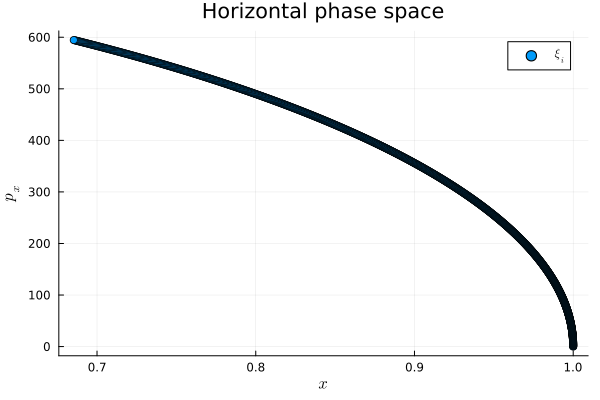

In [9]:
x_i = [Γi[i][1] for i in 1:N]
px_i = [Γi[i][2] for i in 1:N]

plot(x_i, px_i, seriestype=:scatter, label=L"\xi_i")
xaxis!(L"x")
yaxis!(L"p_x")
title!("Horizontal phase space")

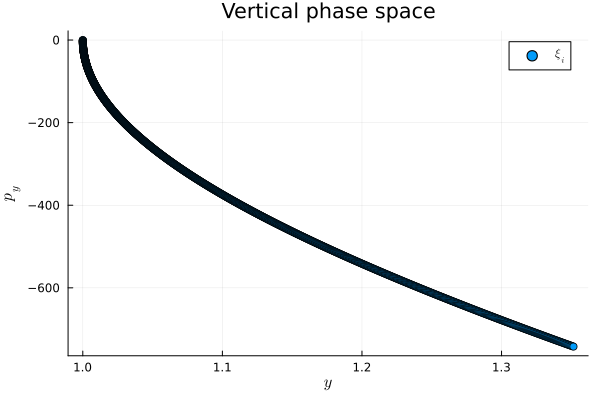

In [10]:
y_i = [Γi[i][3] for i in 1:N]
py_i = [Γi[i][4] for i in 1:N]


plot(y_i, py_i, seriestype=:scatter, label=L"\xi_i")
xaxis!(L"y")
yaxis!(L"p_y")
title!("Vertical phase space")

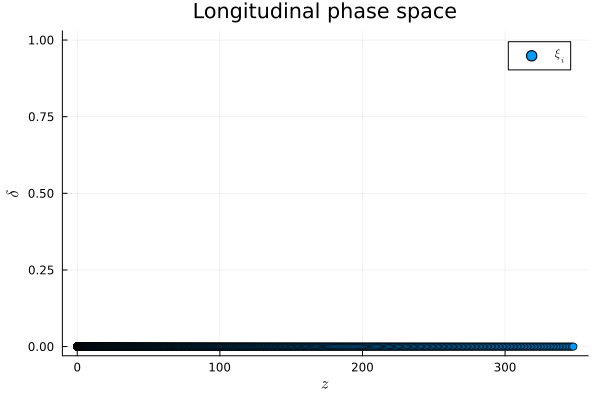

In [11]:
z_i = [Γi[i][5] for i in 1:N]
δ_i = [Γi[i][6] for i in 1:N]

plot(z_i, δ_i, seriestype=:scatter, label=L"\xi_i")
xaxis!(L"z")
yaxis!(L"\delta")
title!("Longitudinal phase space")

## Task 3 - Implement FODO cell

Now we will continue with the FODO cell from Task 1, but use JuliAccel.jl. Using the files pam-09.mad and pam-09.japd, implement the FODO cell from Task 1. 

### Task 3.1
- [x] Add the quadropole to the "pam-09.japd" file.

### Task 3.2
- [ ] Add the focusing and defocusing quadropoles to the "pam-09.mad" file

### Task 3.3 
- [ ] create the lattice with one full fodo cell

In [85]:
### Creation of a initial bunch

N_part = 1000 # number of particles

μ = [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Σ = [16.0 0.0 0.0 0.0 0.0 0.0;
     0.0 1.0 0.0 0.0 0.0 0.0;
     0.0 0.0 16.0 0.0 0.0 0.0;
     0.0 0.0 0.0 1.0 0.0 0.0;
     0.0 0.0 0.0 0.0 0.709 0.0;
     0.0 0.0 0.0 0.0 0.0 0.0981]

D = Gaussian(μ, Σ)

Γi = gen_distribution(D, N_part)


6×1000 Matrix{Float64}:
  0.0627891   4.13051    -1.86164   …  -1.68158     3.86792     1.99202
 -1.08146    -0.598442    1.75179       1.06085     1.35691    -1.19678
  2.72735     0.376919   -2.3426       -2.09416    -1.58937    -0.505538
 -0.110505   -0.230464    0.406491      0.339862    0.889504   -1.42453
  0.0334486   0.0915972  -0.447012      0.829838   -0.774689    0.966994
  0.180369    0.153951   -0.157573  …   0.0935519  -0.0346041   0.0125726

In [108]:
## load new maps

M_FODO = gen_maps(mad, prob, symplectic=true)

0.0%┣                                                ┫ 0/4 [00:00<00:00, -0s/it]
25.0%┣██████████▊                                ┫ 1/4 [00:04<Inf:Inf, InfGs/it]
50.0%┣████████████████████████                        ┫ 2/4 [00:09<00:18, 9s/it]
75.0%┣████████████████████████████████████            ┫ 3/4 [00:13<00:07, 7s/it]
100.0%┣███████████████████████████████████████████████┫ 4/4 [00:18<00:00, 6s/it]
100.0%┣███████████████████████████████████████████████┫ 4/4 [00:18<00:00, 6s/it]


4-element Vector{Vector{TaylorN{Float64}}}:
 [ 0.9803306843655638 x + 0.19735982261728396 px + 0.046201091218322915 x δ - 0.4609028678565435 px δ - 0.00035693536617654455 x δ² - 7.185810020832666e-5 px δ² - 5.607224743910539e-6 x δ³ + 5.593776893649639e-5 px δ³ + 2.16598435710556e-8 x δ⁴ + 4.360551957901986e-9 px δ⁴ + 𝒪(‖x‖¹⁰),  - 0.19735982261728396 x + 0.9803306843655638 px - 0.0030289186176686673 x δ + 0.04597792841660907 px δ + 7.185810020832666e-5 x δ² - 0.00035693536617654455 px δ² + 3.6760662946305994e-7 x δ³ - 5.580140448914624e-6 px δ³ - 4.360551957901988e-9 x δ⁴ + 2.1659843571055617e-8 px δ⁴ + 𝒪(‖x‖¹⁰),  1.0203360178569219 y + 0.20269351150617285 py - 0.047240534571716175 y δ - 0.4733644057299719 py δ - 0.0003715846980058078 y δ² - 7.381667013867926e-5 py δ² + 5.734666314251256e-6 y δ³ + 5.74630862354913e-5 py δ³ + 2.2553875288076763e-8 y δ⁴ + 4.4804104728307494e-9 py δ⁴ + 𝒪(‖x‖¹⁰),  0.20269351150617285 y + 1.0203360178569219 py - 0.003194674994310617 y δ - 0.0474296836913264

### Task 3.4

- [ ] Evolve the Gaussian bunch through the FODO cells

In [138]:

## TODO 
## evolve Γi using M_Fodo 
M1 = TaylorSeries.jacobian(M_FODO[1])
M2 = TaylorSeries.jacobian(M_FODO[2])
M3 = TaylorSeries.jacobian(M_FODO[3])
M4 = TaylorSeries.jacobian(M_FODO[4])
M_FODO_actuallythematrix = M4 * M3 * M2 * M1
println(M_FODO_actuallythematrix)
println(M1)

N_evolutions = 100
Γ = Array{Float64, 3}(undef, N_evolutions*4 + 4, 6, 1000)
Γ[1, :, :] = Γi  # Initialize the first state


for i in 1:4:N_evolutions*4
    Γ[i+1, :, :] = M1 * Γ[i, :, :]
    Γ[i+2, :, :] = M2 * Γ[i+1, :, :]
    Γ[i+3, :, :] = M3 * Γ[i+2, :, :]
    Γ[i+4, :, :] = M4 * Γ[i+3, :, :]
    # Γ[i+1, :, :] = M_FODO_actuallythematrix * Γ[i, :, :]
end

Γf = Γ[N_evolutions, :, :]

[0.7162195935782146 2.6393236420104325 0.0 0.0 0.0 0.0; -0.042670222119494956 1.2389769309963488 0.0 0.0 0.0 0.0; 0.0 0.0 1.1963067088768538 2.1592365267117937 0.0 0.0; 0.0 0.0 -0.042670222119494935 0.7588898156977096 0.0 0.0; 0.0 0.0 0.0 0.0 1.0 10.689621070565918; 0.0 0.0 0.0 0.0 0.0 1.0]
[0.9803306843655638 0.19735982261728396 0.0 0.0 0.0 0.0; -0.19735982261728396 0.9803306843655638 0.0 0.0 0.0 0.0; 0.0 0.0 1.0203360178569219 0.20269351150617285 0.0 0.0; 0.0 0.0 0.20269351150617285 1.0203360178569219 0.0 0.0; 0.0 0.0 0.0 0.0 1.0 0.8908017558804933; 0.0 0.0 0.0 0.0 0.0 1.0]


6×1000 Matrix{Float64}:
 10.8478    11.8171    -20.0699     8.73708   …  -8.00795     14.7337
  0.526072   0.981408   -1.14877    0.103843      0.00511378   0.906193
 -0.200691   2.11304    -2.92723   15.8952       -8.09137     14.4125
  0.302794  -0.26364     0.182233  -1.70304       0.994866    -2.10747
 47.4319    40.5479    -41.855     88.1779       -9.86818      4.2709
  0.180369   0.153951   -0.157573   0.330928  …  -0.0346041    0.0125726

[ Info: Saved animation to /home/jonas/Polybox/ETH/ParticleAcceleratorModelling/Exercises_PAM/Ex9/cross-section.gif


Plots.AnimatedGif("/home/jonas/Polybox/ETH/ParticleAcceleratorModelling/Exercises_PAM/Ex9/cross-section.gif")
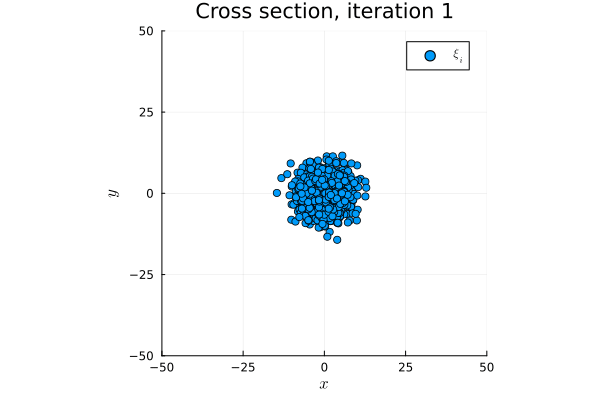

In [128]:
# Nice gif of cross-section

anim = @animate for i ∈ 1:N_evolutions*4
    plot(Γ[i, 1,:], Γ[i, 3,:], seriestype=:scatter, label=L"\xi_i", aspect_ratio=:equal)
    xaxis!(L"x")
    yaxis!(L"y")
    xlims!(-50, 50)
    ylims!(-50, 50)
    title!("Cross section, iteration " * string(i))
end
gif(anim, "cross-section.gif", fps=30)

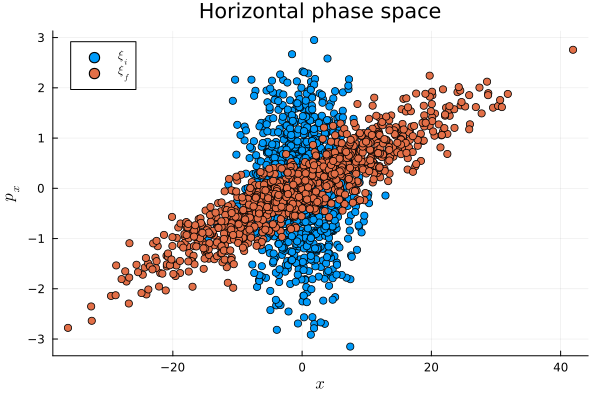

In [139]:
x_i = Γi[1,:]
px_i = Γi[2,:]

x_f = Γf[1,:]
px_f = Γf[2,:]

plot(x_i, px_i, seriestype=:scatter, label=L"\xi_i")
plot!(x_f, px_f, seriestype=:scatter, label=L"\xi_f")
xaxis!(L"x")
yaxis!(L"p_x")
title!("Horizontal phase space")

[ Info: Saved animation to /home/jonas/Polybox/ETH/ParticleAcceleratorModelling/Exercises_PAM/Ex9/evolution-x.gif


Plots.AnimatedGif("/home/jonas/Polybox/ETH/ParticleAcceleratorModelling/Exercises_PAM/Ex9/evolution-x.gif")
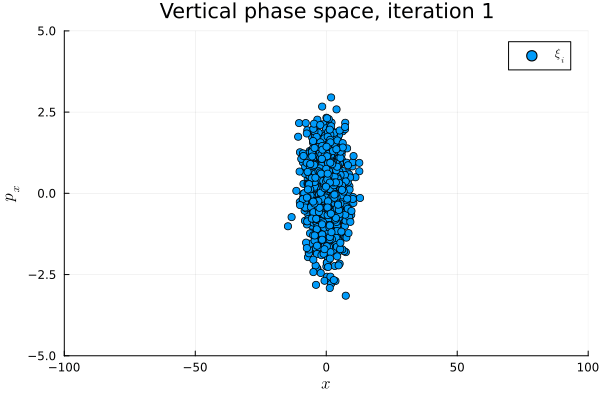

In [144]:
anim = @animate for i ∈ 1:4:N_evolutions*4  # looks better
    plot(Γ[i, 1,:], Γ[i, 2,:], seriestype=:scatter, label=L"\xi_i")
    xaxis!(L"x")
    yaxis!(L"p_x")
    xlims!(-100, 100)
    ylims!(-5, 5)
    title!("Vertical phase space, iteration " * string(i))
end
gif(anim, "evolution-x.gif", fps=30/4)

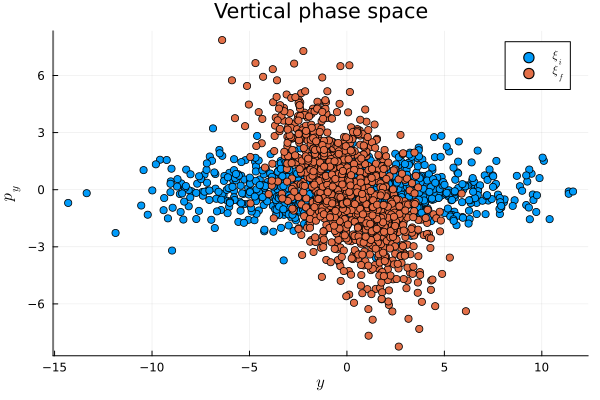

In [132]:
y_i = Γi[3,:]
py_i = Γi[4,:]

y_f = Γf[3,:]
py_f = Γf[4,:]

plot(y_i, py_i, seriestype=:scatter, label=L"\xi_i")
plot!(y_f, py_f, seriestype=:scatter, label=L"\xi_f")
xaxis!(L"y")
yaxis!(L"p_y")
title!("Vertical phase space")

[ Info: Saved animation to /home/jonas/Polybox/ETH/ParticleAcceleratorModelling/Exercises_PAM/Ex9/evolution-y.gif


Plots.AnimatedGif("/home/jonas/Polybox/ETH/ParticleAcceleratorModelling/Exercises_PAM/Ex9/evolution-y.gif")
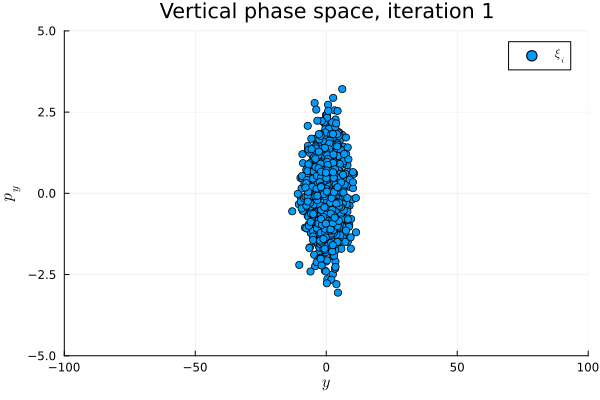

In [72]:
anim = @animate for i ∈ 1:91  # looks better
    plot(Γ[i, 3,:], Γ[i, 4,:], seriestype=:scatter, label=L"\xi_i")
    xaxis!(L"y")
    yaxis!(L"p_y")
    xlims!(-100, 100)
    ylims!(-5, 5)
    title!("Vertical phase space, iteration " * string(i))
end
gif(anim, "evolution-y.gif", fps=30)

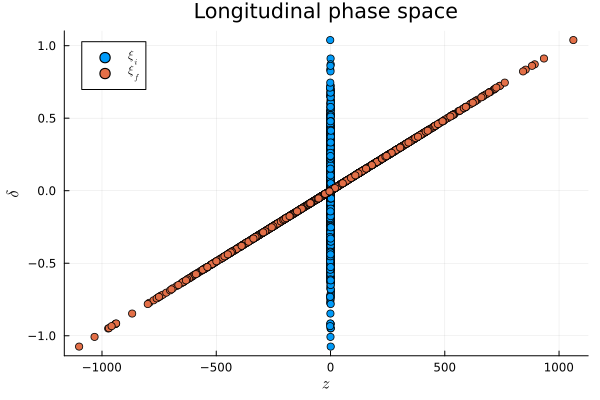

In [42]:
z_i = Γi[5,:]
δ_i = Γi[6,:]

z_f = Γf[5,:]
δ_f = Γf[6,:]

plot(z_i, δ_i, seriestype=:scatter, label=L"\xi_i")
plot!(z_f, δ_f, seriestype=:scatter, label=L"\xi_f")
xaxis!(L"z")
yaxis!(L"\delta")
title!("Longitudinal phase space")

### Task 3.5

- [ ] Propagate the bunch through the fodo 4 more times and Plot the x-px plot for each further iteration

In [ ]:
### Propagate 

# TODO

## plot x-px

# TODO

### Task 3.6

- [ ] Calculate the eigenvalues and eigenvectors of the accumulated matrix

In [ ]:
### Todo